Constrained Tau (0.43) Interventions: 70
Constrained Tau (0.75) Interventions: 70
Unconstrained Tau Interventions: 70
Random Interventions: 70


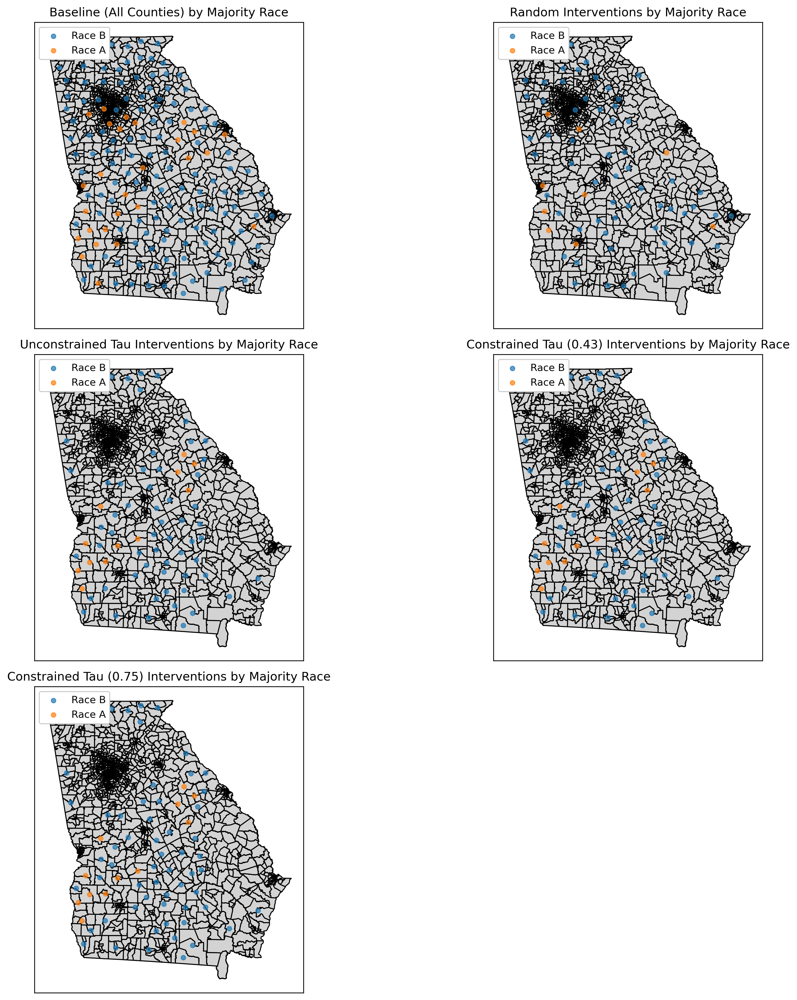

Combined map plot saved


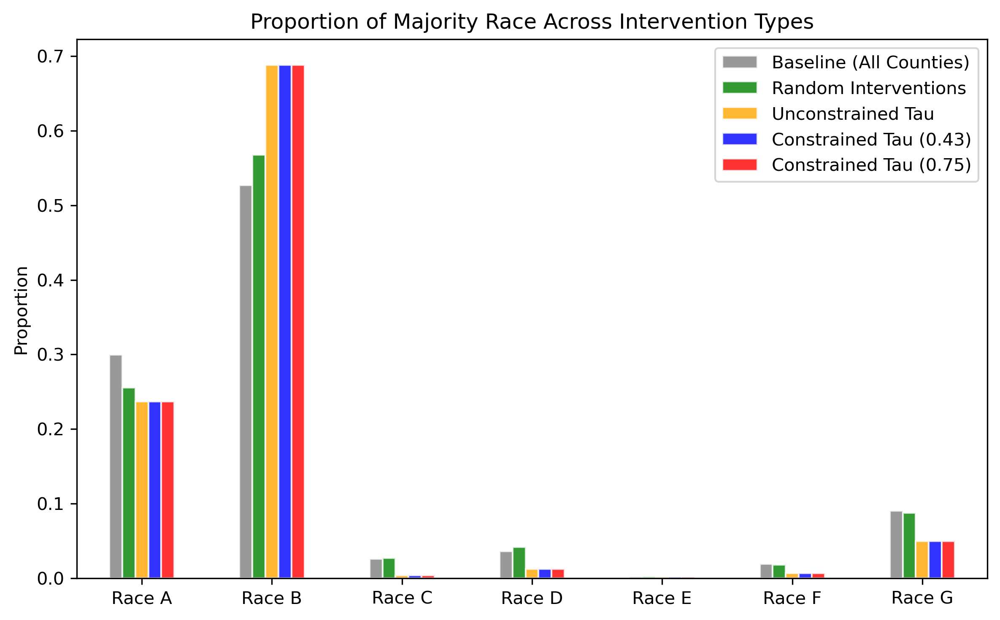

Race proportions comparison plot saved


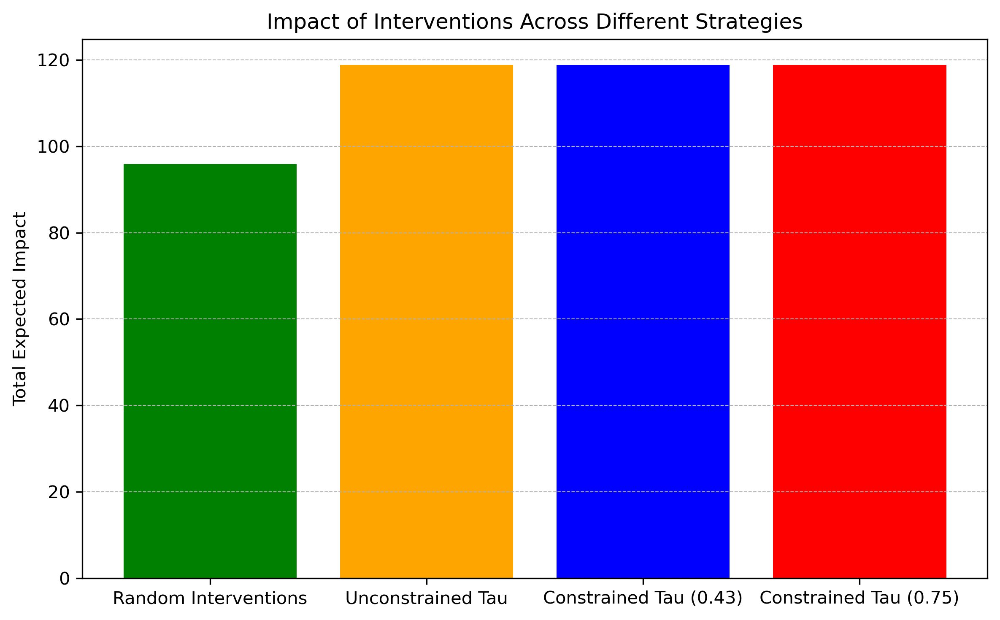

Impact comparison plot saved


In [14]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os
from geodatasets import get_path

# Create results folder if it doesn't exist
results_folder = "results"
os.makedirs(results_folder, exist_ok=True)

# File paths for tau values
constrained_path_0_43 = 'results/budget130_tau_0.43.npy'
constrained_path_0_75 = 'results/budget130_tau_0.75.npy'
unconstrained_path = 'results/budget130_tau_None.npy'

# Load data for tau = 0.43, tau = 0.75, and tau = None
optimal_interventions_constrained_0_43 = np.load(constrained_path_0_43)
optimal_interventions_constrained_0_75 = np.load(constrained_path_0_75)
optimal_interventions_unconstrained = np.load(unconstrained_path)
school_df = pd.read_csv('GA_features.csv')
neighbor_index_matrix = np.load('index_matrix.npy')
neighbor_distance_matrix = np.load('distance_matrix.npy')

# Constants
NUM_SCHOOLS = school_df.shape[0]
race_columns = ['registered_A', 'registered_B', 'registered_C', 'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add majority race column
school_df['majority_race'] = school_df[race_columns].idxmax(axis=1)
school_df['majority_race'] = school_df['majority_race'].str[2:]  # Remove 'n_' prefix

# Generate random interventions with the same count as Constrained Tau (for tau = 0.43)
num_random_interventions = optimal_interventions_constrained_0_43.sum()
random_interventions = np.zeros(NUM_SCHOOLS, dtype=int)
random_indices = np.random.choice(NUM_SCHOOLS, size=num_random_interventions, replace=False)
random_interventions[random_indices] = 1

print(f"Constrained Tau (0.43) Interventions: {optimal_interventions_constrained_0_43.sum()}")
print(f"Constrained Tau (0.75) Interventions: {optimal_interventions_constrained_0_75.sum()}")
print(f"Unconstrained Tau Interventions: {optimal_interventions_unconstrained.sum()}")
print(f"Random Interventions: {random_interventions.sum()}")

# Import parameters 
params = pd.read_csv('results/params.csv')
# Extract weight vectors
ALPHA = params['alpha'].values
BETA = params['beta'].values
GAMMA = params['gamma'].values
DELTA = params['delta'].values
THETA = params['theta'].values

# Load neighborhood matrices
NEIGHBOR_INDEX_MATRIX = np.load('index_matrix.npy')
NEIGHBOR_DISTANCE_MATRIX = np.load('distance_matrix.npy')

df = pd.read_csv('GA_features.csv')
contribution = df['contribution'].values
n_poll = df['n_poll'].values
tweets = df['tweets'].values

# Optimization Helper
def expected_impact_i(index, intervention_array):
    """
    Calculate the expected impact for a given index, intervention array, and demographic vector.
    """
    racial_prop = ['frac_registered_A', 'frac_registered_B', 'frac_registered_C', 'frac_registered_D', 
                   'frac_registered_E', 'frac_registered_F', 'frac_registered_G']
    demographic_vector = df.loc[index,  racial_prop]
    
    # Get nearest neighbors and distances for the given index
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    # Compute terms for each feature using the revised features and weights
    frac_unem_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * intervention_array)
    n_poll_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)

    # Calculate total impact
    impact = frac_unem_term + n_poll_term + contribution_term + tweets_term + demographic_term
    
    # Clamp impact between 0 and 1
    return max(min(impact, 1), 0)

def expected_impact(intervention_array):
    impact = 0
    for i in range(len(intervention_array)):
        impact += expected_impact_i(i, intervention_array[i])
    return impact

# Separate schools into unique and common groups
all_schools_baseline = school_df
unique_to_random = school_df[random_interventions == 1]
unique_to_unconstrained = school_df[optimal_interventions_unconstrained == 1]
unique_to_constrained_0_43 = school_df[optimal_interventions_constrained_0_43 == 1]
unique_to_constrained_0_75 = school_df[optimal_interventions_constrained_0_75 == 1]

# Function to plot a single map
def plot_map(ax, title, schools):
    boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
    boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    for race in school_df['majority_race'].unique():
        data = schools[schools['majority_race'] == race]
        ax.scatter(data['longitude'], data['latitude'], label=f"Race {race[-1]}", alpha=0.7, s=20)
    ax.set_title(title)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Combined map plot
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 14), dpi=300)
axes = axes.ravel()
# Hide the last empty plot
axes[5].set_visible(False)


plot_map(axes[0], "Baseline (All Counties) by Majority Race", all_schools_baseline)
plot_map(axes[1], "Random Interventions by Majority Race", unique_to_random)
plot_map(axes[2], "Unconstrained Tau Interventions by Majority Race", unique_to_unconstrained)
plot_map(axes[3], "Constrained Tau (0.43) Interventions by Majority Race", unique_to_constrained_0_43)
plot_map(axes[4], "Constrained Tau (0.75) Interventions by Majority Race", unique_to_constrained_0_75)

plt.tight_layout()
plt.savefig('results/intervention_maps_comparison.png')
plt.show()
print(f"Combined map plot saved")

# Bar plots for race proportions
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Race proportion calculations
baseline_counts = all_schools_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_43_counts = unique_to_constrained_0_43[race_columns].sum(axis=0)
constrained_0_43_freq = constrained_0_43_counts / constrained_0_43_counts.sum()

constrained_0_75_counts = unique_to_constrained_0_75[race_columns].sum(axis=0)
constrained_0_75_freq = constrained_0_75_counts / constrained_0_75_counts.sum()

# Combine data for plotting
race_df = pd.concat(
    (baseline_freq, random_freq, unconstrained_freq, constrained_0_43_freq, constrained_0_75_freq),
    axis=1
)
race_df.columns = ['Baseline (All Counties)', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot bar chart
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue', 'red'], edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion')
ax.set_title('Proportion of Majority Race Across Intervention Types')
plt.legend(loc='upper right')
plt.tight_layout()

plt.savefig('results/race_proportions_comparison.png')
plt.show()
print(f"Race proportions comparison plot saved")

# Impact plot

# Calculate impacts
null_array = np.full(NUM_SCHOOLS, np.nan)
baseline_impact = expected_impact(null_array)
random_impact = expected_impact(random_interventions)
unconstrained_impact = expected_impact(optimal_interventions_unconstrained)
constrained_impact_0_43 = expected_impact(optimal_interventions_constrained_0_43)
constrained_impact_0_75 = expected_impact(optimal_interventions_constrained_0_75)

fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
labels = ['Baseline', 'Random Interventions', 'Unconstrained Tau', 'Constrained Tau (0.43)', 'Constrained Tau (0.75)']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact_0_43, constrained_impact_0_75]

ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue', 'red'])
ax.set_ylabel('Total Expected Impact')
ax.set_title('Impact of Interventions Across Different Strategies')
ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.savefig('results/impact_comparison.png')
plt.show()
print(f"Impact comparison plot saved")

Constrained Tau (0.4) Polling Allocations: 5
Unconstrained Tau Polling Allocations: 5
Random Polling Allocations: 5


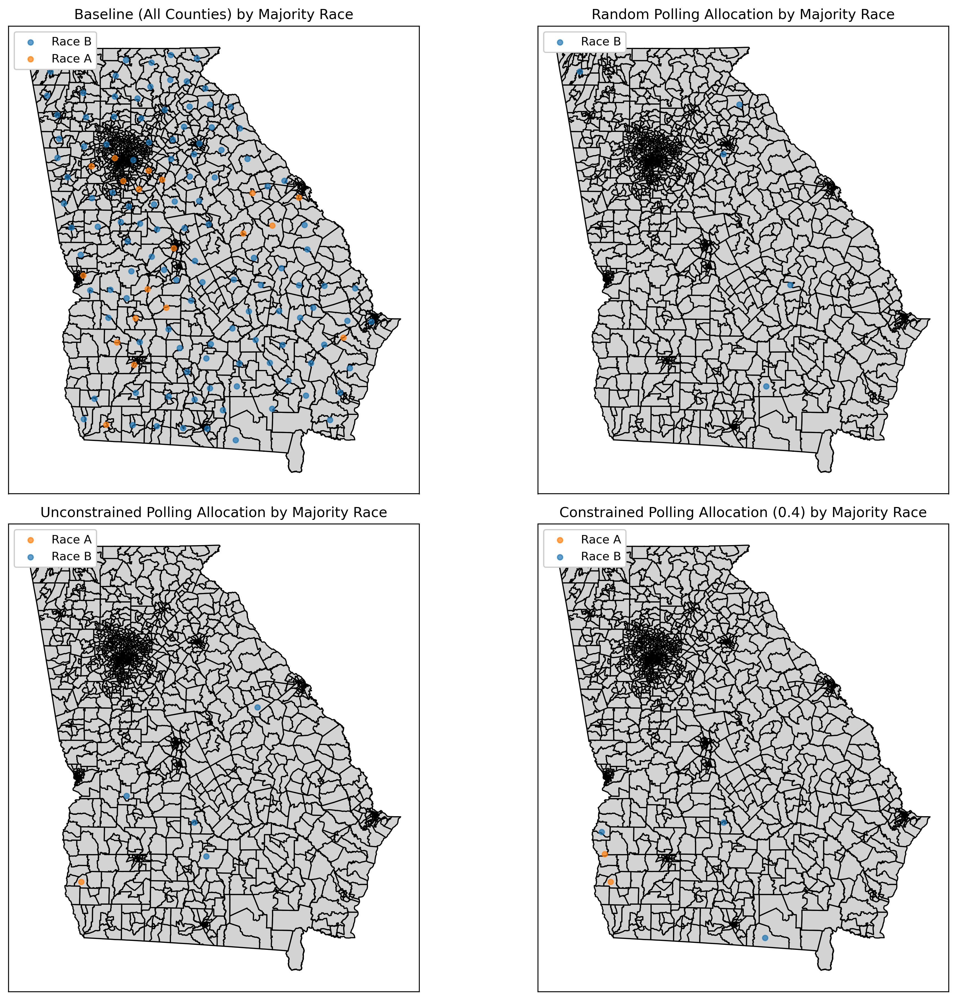

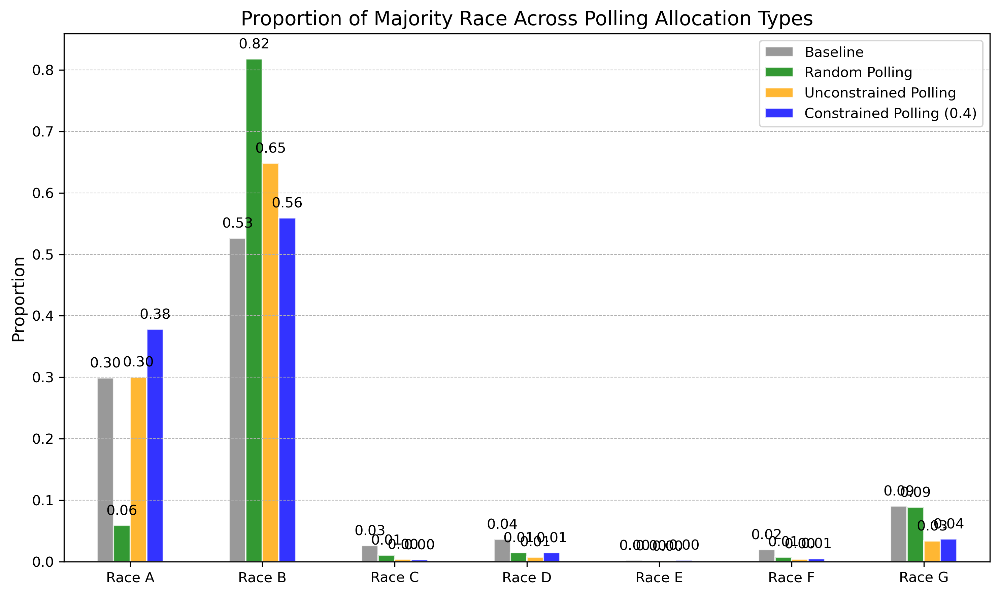

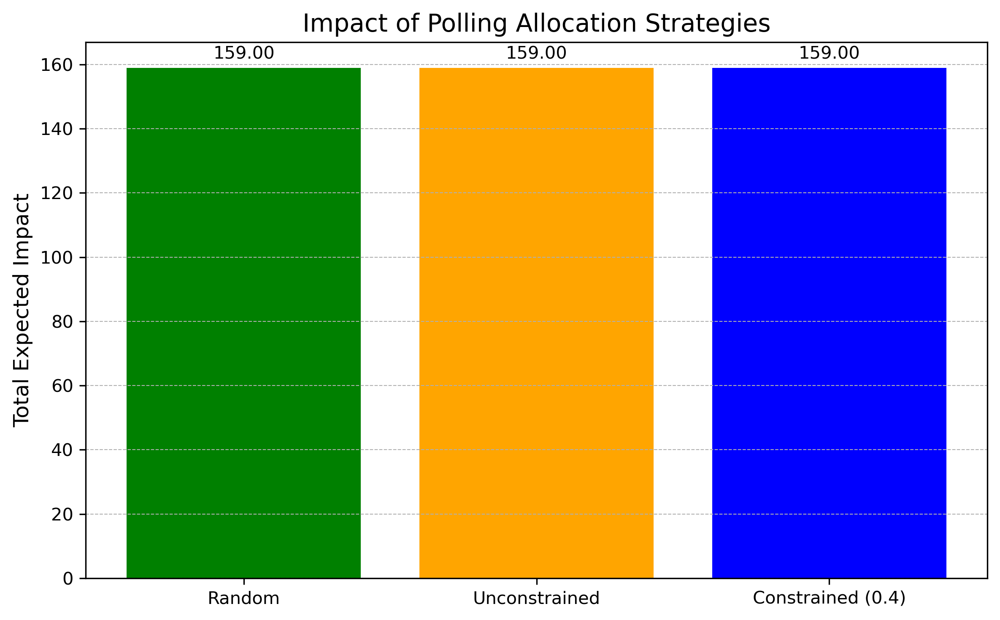

In [17]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from geodatasets import get_path  # if needed for your shapefile paths

# -------------------------------
# Setup & Load Data
# -------------------------------

# File paths for different intervention strategies
constrained_path_0_4 = 'Results/tight_tau_budget_5.npy'  # for constrained tau = 0.4
unconstrained_path = 'Results/no_tau_budget_5.npy'       # for unconstrained tau

# Load intervention arrays
try:
    optimal_polling_constrained_0_4 = np.load(constrained_path_0_4)
    optimal_polling_unconstrained = np.load(unconstrained_path)
except FileNotFoundError as e:
    print(f"Error loading intervention files: {e}")
    exit()

# Load county data and neighborhood matrices
try:
    county_df = pd.read_csv('GA_features.csv')
    neighbor_index_matrix = np.load('index_matrix.npy')
    neighbor_distance_matrix = np.load('distance_matrix.npy')
except FileNotFoundError as e:
    print(f"Error loading data files: {e}")
    exit()

# Total number of counties
NUM_COUNTIES = county_df.shape[0]

# Columns for race counts (assumed to be registered counts)
race_columns = ['registered_A', 'registered_B', 'registered_C', 
                'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add a majority race column (based on the highest registered number)
county_df['majority_race'] = county_df[race_columns].idxmax(axis=1)
# Remove the "registered_" prefix for clarity
county_df['majority_race'] = county_df['majority_race'].str.replace('registered_', '')

# Generate random polling allocations with the same number of interventions as in the constrained (tau = 0.4) case
num_random_polling = int(optimal_polling_constrained_0_4.sum())
random_polling = np.zeros(NUM_COUNTIES, dtype=int)
random_indices = np.random.choice(NUM_COUNTIES, size=num_random_polling, replace=False)
random_polling[random_indices] = 1

print(f"Constrained Tau (0.4) Polling Allocations: {optimal_polling_constrained_0_4.sum()}")
print(f"Unconstrained Tau Polling Allocations: {optimal_polling_unconstrained.sum()}")
print(f"Random Polling Allocations: {random_polling.sum()}")

# -------------------------------
# Helper Functions for Impact Calculation
# -------------------------------
# These functions assume that you have a CSV with additional columns for fractional race registrations.
# Here, we expect columns like 'frac_registered_A', 'frac_registered_B', etc.
try:
    # Also assume that the weight parameters are stored in a CSV file.
    params = pd.read_csv('results/params.csv')
    ALPHA = params['alpha'].values
    BETA = params['beta'].values
    GAMMA = params['gamma'].values
    DELTA = params['delta'].values
    THETA = params['theta'].values
except FileNotFoundError as e:
    print(f"Error loading data or parameter files: {e}")
    exit()

# Other feature values
contribution = county_df['contribution'].values
n_poll = county_df['n_poll'].values
tweets = county_df['tweets'].values

def calculate_expected_impact(index, polling_array, demographic_vector):
    """
    Calculate the expected impact for a single county using the polling allocation decision.
    For each term, we multiply the (binary) polling vector by the neighbor distances,
    take the maximum value, and weight it by the corresponding regression coefficient.
    """
    # Get the indices and distances of the county's neighbors
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    unemployment_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * polling_array)
    polling_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)
    
    impact = unemployment_term + polling_term + contribution_term + tweets_term + demographic_term
    return max(min(impact, 1), 0)

def calculate_total_impact(polling_array):
    """
    Calculate the total impact over all counties given a binary polling allocation solution.
    """
    total_impact = 0
    for i in range(NUM_COUNTIES):
        demographic_vector = county_df[race_columns].values[i, :]
        total_impact += calculate_expected_impact(i, polling_array[i], demographic_vector)
    return total_impact

# -------------------------------
# Create Groups for Plotting
# -------------------------------

# For a baseline, we might assume counties with no polling stations (or any other filter)
all_counties_baseline = county_df[county_df['n_poll'] == 0]

# Select counties that received a polling allocation
unique_to_random = county_df[random_polling == 1]
unique_to_unconstrained = county_df[optimal_polling_unconstrained == 1]
unique_to_constrained_0_4 = county_df[optimal_polling_constrained_0_4 == 1]

# -------------------------------
# Plot 1: Combined Map Plot
# -------------------------------
# -------------------------------
# Plot 1: Combined Map Plot (Revised for Consistent Colors)
# -------------------------------
def plot_map(ax, title, counties, color_map):
    """
    Plot counties colored by majority race, using a consistent color map.
    """
    # Load a shapefile for the area (adjust the path if necessary)
    try:
        boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
        boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    except FileNotFoundError as e:
        print(f"Error loading shapefile: {e}")
        return
    
    # Plot counties colored by majority race
    for race in counties['majority_race'].unique():
        subset = counties[counties['majority_race'] == race]
        ax.scatter(subset['longitude'], subset['latitude'], 
                   color=color_map[race], label=f"Race {race}", alpha=0.7, s=20)
    ax.set_title(title, fontsize=12)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Create a consistent color map for all races
unique_races = county_df['majority_race'].unique()
color_map = {race: plt.cm.tab10(i) for i, race in enumerate(unique_races)}

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12), dpi=300)
axes = axes.ravel()

# Plot each subplot with consistent colors
plot_map(axes[0], "Baseline (All Counties) by Majority Race", all_counties_baseline, color_map)
plot_map(axes[1], "Random Polling Allocation by Majority Race", unique_to_random, color_map)
plot_map(axes[2], "Unconstrained Polling Allocation by Majority Race", unique_to_unconstrained, color_map)
plot_map(axes[3], "Constrained Polling Allocation (0.4) by Majority Race", unique_to_constrained_0_4, color_map)

plt.tight_layout()
plt.show()


# -------------------------------
# Plot 2: Bar Plot for Race Proportions
# -------------------------------
# Calculate proportions for each polling allocation type
baseline_counts = all_counties_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_4_counts = unique_to_constrained_0_4[race_columns].sum(axis=0)
constrained_0_4_freq = constrained_0_4_counts / constrained_0_4_counts.sum()

# Combine into a DataFrame
race_df = pd.concat(
    [baseline_freq, random_freq, unconstrained_freq, constrained_0_4_freq],
    axis=1
)
race_df.columns = ['Baseline', 'Random Polling', 'Unconstrained Polling', 
                   'Constrained Polling (0.4)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue'],
                 edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Proportion of Majority Race Across Polling Allocation Types', fontsize=14)
ax.legend(loc='upper right', fontsize=10)
ax.grid(axis='y', linestyle='--', linewidth=0.5)

# Add number labels to bars
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}", 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
                textcoords='offset points', fontsize=10)

plt.tight_layout()
plt.show()

# -------------------------------
# Plot 3: Impact Comparison Plot
# -------------------------------
# For a baseline impact, here we assume a null polling allocation (or any other baseline definition)
null_array = np.full(NUM_COUNTIES, np.nan)
baseline_impact = calculate_total_impact(null_array)
random_impact = calculate_total_impact(random_polling)
unconstrained_impact = calculate_total_impact(optimal_polling_unconstrained)
constrained_impact_0_4 = calculate_total_impact(optimal_polling_constrained_0_4)

labels = ['Baseline', 'Random', 'Unconstrained', 'Constrained (0.4)']
values = [baseline_impact, random_impact, unconstrained_impact, constrained_impact_0_4]

# Plot
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
bars = ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue'])
ax.set_ylabel('Total Expected Impact', fontsize=12)
ax.set_title('Impact of Polling Allocation Strategies', fontsize=14)
ax.grid(axis='y', linestyle='--', linewidth=0.5)

# Add number labels to bars
for bar in bars:
    height = bar.get_height()
    ax.annotate(f"{height:.2f}", 
                xy=(bar.get_x() + bar.get_width() / 2, height), 
                xytext=(0, 3), textcoords='offset points', 
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

Constrained Tau (0.4) Polling Allocations: 7
Unconstrained Tau Polling Allocations: 7
Random Polling Allocations: 7


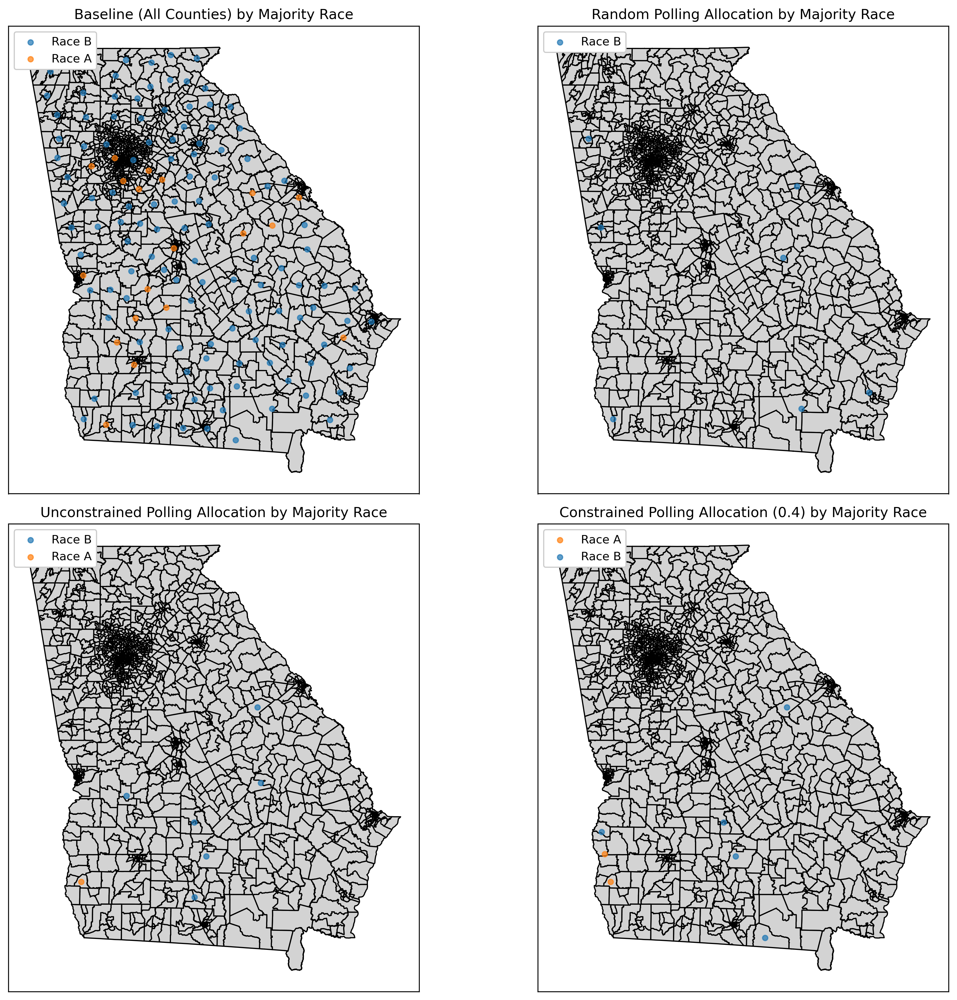

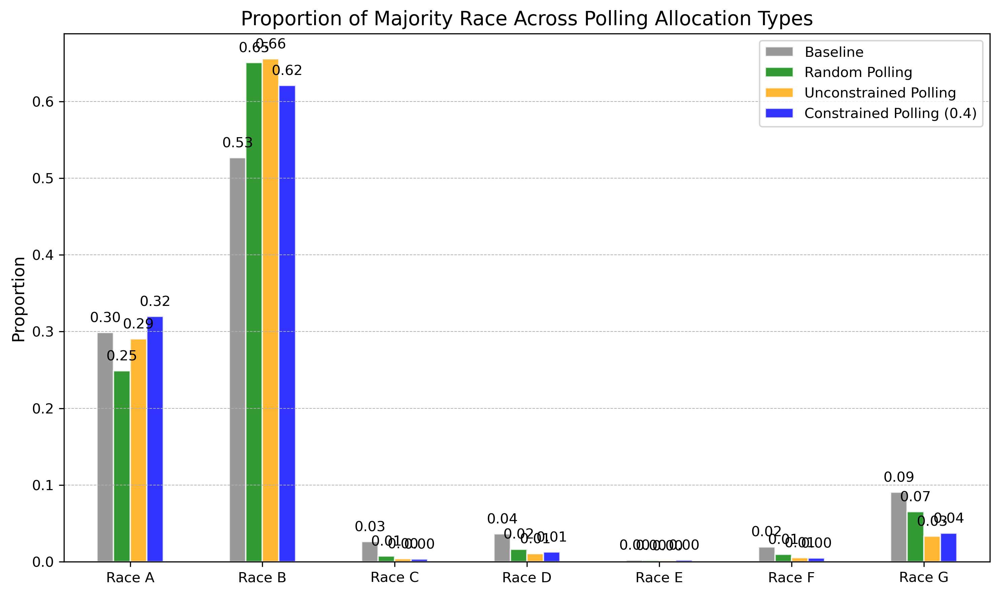

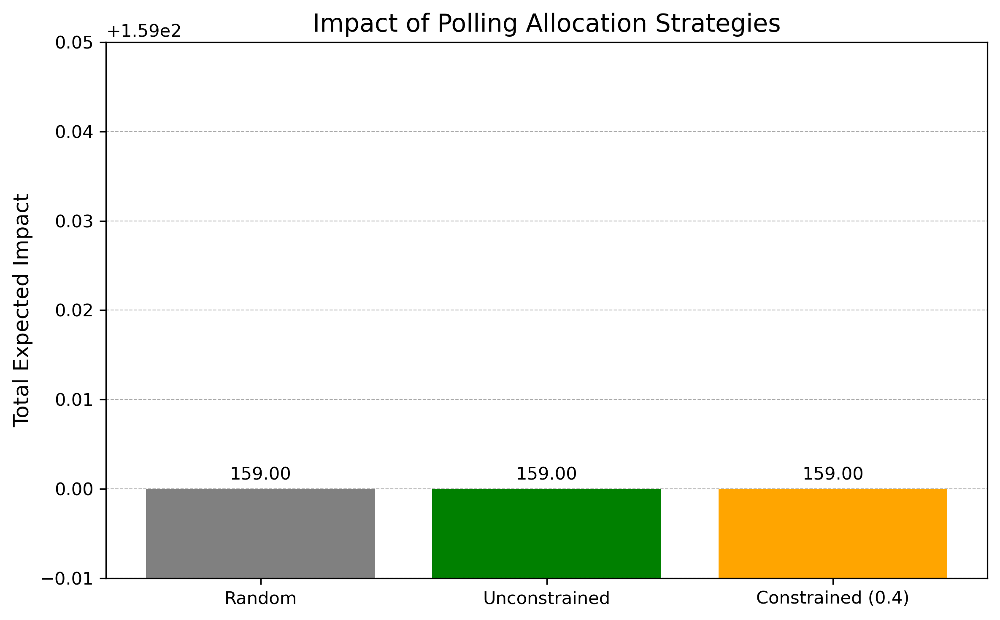

In [22]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from geodatasets import get_path  # if needed for your shapefile paths

# -------------------------------
# Setup & Load Data
# -------------------------------

# File paths for different intervention strategies
constrained_path_0_4 = 'Results/tight_tau_budget_7.npy'  # for constrained tau = 0.4
unconstrained_path = 'Results/no_tau_budget_7.npy'       # for unconstrained tau

# Load intervention arrays
try:
    optimal_polling_constrained_0_4 = np.load(constrained_path_0_4)
    optimal_polling_unconstrained = np.load(unconstrained_path)
except FileNotFoundError as e:
    print(f"Error loading intervention files: {e}")
    exit()

# Load county data and neighborhood matrices
try:
    county_df = pd.read_csv('GA_features.csv')
    neighbor_index_matrix = np.load('index_matrix.npy')
    neighbor_distance_matrix = np.load('distance_matrix.npy')
except FileNotFoundError as e:
    print(f"Error loading data files: {e}")
    exit()

# Total number of counties
NUM_COUNTIES = county_df.shape[0]

# Columns for race counts (assumed to be registered counts)
race_columns = ['registered_A', 'registered_B', 'registered_C', 
                'registered_D', 'registered_E', 'registered_F', 'registered_G']

# Add a majority race column (based on the highest registered number)
county_df['majority_race'] = county_df[race_columns].idxmax(axis=1)
# Remove the "registered_" prefix for clarity
county_df['majority_race'] = county_df['majority_race'].str.replace('registered_', '')

# Generate random polling allocations with the same number of interventions as in the constrained (tau = 0.4) case
num_random_polling = int(optimal_polling_constrained_0_4.sum())
random_polling = np.zeros(NUM_COUNTIES, dtype=int)
random_indices = np.random.choice(NUM_COUNTIES, size=num_random_polling, replace=False)
random_polling[random_indices] = 1

print(f"Constrained Tau (0.4) Polling Allocations: {optimal_polling_constrained_0_4.sum()}")
print(f"Unconstrained Tau Polling Allocations: {optimal_polling_unconstrained.sum()}")
print(f"Random Polling Allocations: {random_polling.sum()}")

# -------------------------------
# Helper Functions for Impact Calculation
# -------------------------------
# These functions assume that you have a CSV with additional columns for fractional race registrations.
# Here, we expect columns like 'frac_registered_A', 'frac_registered_B', etc.
try:
    # Also assume that the weight parameters are stored in a CSV file.
    params = pd.read_csv('results/params.csv')
    ALPHA = params['alpha'].values
    BETA = params['beta'].values
    GAMMA = params['gamma'].values
    DELTA = params['delta'].values
    THETA = params['theta'].values
except FileNotFoundError as e:
    print(f"Error loading data or parameter files: {e}")
    exit()

# Other feature values
contribution = county_df['contribution'].values
n_poll = county_df['n_poll'].values
tweets = county_df['tweets'].values

def calculate_expected_impact(index, polling_array, demographic_vector):
    """
    Calculate the expected impact for a single county using the polling allocation decision.
    For each term, we multiply the (binary) polling vector by the neighbor distances,
    take the maximum value, and weight it by the corresponding regression coefficient.
    """
    # Get the indices and distances of the county's neighbors
    nearest_neighbors = neighbor_index_matrix[index, :]
    neighbor_distances = neighbor_distance_matrix[index, nearest_neighbors]
    
    unemployment_term = np.dot(demographic_vector, ALPHA) * np.max(neighbor_distances * polling_array)
    polling_term = np.dot(demographic_vector, BETA) * np.max(neighbor_distances * n_poll[nearest_neighbors])
    contribution_term = np.dot(demographic_vector, GAMMA) * np.max(neighbor_distances * contribution[nearest_neighbors])
    tweets_term = np.dot(demographic_vector, DELTA) * np.max(neighbor_distances * tweets[nearest_neighbors])
    demographic_term = np.dot(demographic_vector, THETA)
    
    impact = unemployment_term + polling_term + contribution_term + tweets_term + demographic_term
    return max(min(impact, 1), 0)

def calculate_total_impact(polling_array):
    """
    Calculate the total impact over all counties given a binary polling allocation solution.
    """
    total_impact = 0
    for i in range(NUM_COUNTIES):
        demographic_vector = county_df[race_columns].values[i, :]
        total_impact += calculate_expected_impact(i, polling_array[i], demographic_vector)
    return total_impact

# -------------------------------
# Create Groups for Plotting
# -------------------------------

# For a baseline, we might assume counties with no polling stations (or any other filter)
all_counties_baseline = county_df[county_df['n_poll'] == 0]

# Select counties that received a polling allocation
unique_to_random = county_df[random_polling == 1]
unique_to_unconstrained = county_df[optimal_polling_unconstrained == 1]
unique_to_constrained_0_4 = county_df[optimal_polling_constrained_0_4 == 1]

# -------------------------------
# Plot 1: Combined Map Plot
# -------------------------------
# -------------------------------
# Plot 1: Combined Map Plot (Revised for Consistent Colors)
# -------------------------------
def plot_map(ax, title, counties, color_map):
    """
    Plot counties colored by majority race, using a consistent color map.
    """
    # Load a shapefile for the area (adjust the path if necessary)
    try:
        boroughs = gpd.read_file(r'./ga_map/tl_2009_13_tract00.shp').to_crs("EPSG:4326")
        boroughs.plot(ax=ax, color='lightgray', edgecolor='black')
    except FileNotFoundError as e:
        print(f"Error loading shapefile: {e}")
        return
    
    # Plot counties colored by majority race
    for race in counties['majority_race'].unique():
        subset = counties[counties['majority_race'] == race]
        ax.scatter(subset['longitude'], subset['latitude'], 
                   color=color_map[race], label=f"Race {race}", alpha=0.7, s=20)
    ax.set_title(title, fontsize=12)
    ax.legend(loc='upper left', framealpha=1)
    ax.set_xticks([])
    ax.set_yticks([])

# Create a consistent color map for all races
unique_races = county_df['majority_race'].unique()
color_map = {race: plt.cm.tab10(i) for i, race in enumerate(unique_races)}

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12), dpi=300)
axes = axes.ravel()

# Plot each subplot with consistent colors
plot_map(axes[0], "Baseline (All Counties) by Majority Race", all_counties_baseline, color_map)
plot_map(axes[1], "Random Polling Allocation by Majority Race", unique_to_random, color_map)
plot_map(axes[2], "Unconstrained Polling Allocation by Majority Race", unique_to_unconstrained, color_map)
plot_map(axes[3], "Constrained Polling Allocation (0.4) by Majority Race", unique_to_constrained_0_4, color_map)

plt.tight_layout()
plt.show()


# -------------------------------
# Plot 2: Bar Plot for Race Proportions
# -------------------------------
# Calculate proportions for each polling allocation type
baseline_counts = all_counties_baseline[race_columns].sum(axis=0)
baseline_freq = baseline_counts / baseline_counts.sum()

random_counts = unique_to_random[race_columns].sum(axis=0)
random_freq = random_counts / random_counts.sum()

unconstrained_counts = unique_to_unconstrained[race_columns].sum(axis=0)
unconstrained_freq = unconstrained_counts / unconstrained_counts.sum()

constrained_0_4_counts = unique_to_constrained_0_4[race_columns].sum(axis=0)
constrained_0_4_freq = constrained_0_4_counts / constrained_0_4_counts.sum()

# Combine into a DataFrame
race_df = pd.concat(
    [baseline_freq, random_freq, unconstrained_freq, constrained_0_4_freq],
    axis=1
)
race_df.columns = ['Baseline', 'Random Polling', 'Unconstrained Polling', 
                   'Constrained Polling (0.4)']
race_df.index = [f"Race {col[-1]}" for col in race_columns]

# Plot
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
race_df.plot.bar(ax=ax, rot=0, color=['gray', 'green', 'orange', 'blue'],
                 edgecolor='white', alpha=0.8)
ax.set_ylabel('Proportion', fontsize=12)
ax.set_title('Proportion of Majority Race Across Polling Allocation Types', fontsize=14)
ax.legend(loc='upper right', fontsize=10)
ax.grid(axis='y', linestyle='--', linewidth=0.5)

# Add number labels to bars
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}", 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
                textcoords='offset points', fontsize=10)

plt.tight_layout()
plt.show()

# # -------------------------------
# Plot 3: Impact Comparison Plot (Improved Visualization)
# -------------------------------
# Compute impacts
null_array = np.full(NUM_COUNTIES, np.nan)  # baseline (could also be defined as zeros)
random_impact = calculate_total_impact(random_polling)
unconstrained_impact = calculate_total_impact(optimal_polling_unconstrained)
constrained_impact_0_4 = calculate_total_impact(optimal_polling_constrained_0_4)

# Prepare labels and values
labels = ['Random', 'Unconstrained', 'Constrained (0.4)']
values = [random_impact, unconstrained_impact, constrained_impact_0_4]

# Create plot
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
bars = ax.bar(labels, values, color=['gray', 'green', 'orange', 'blue'])
ax.set_ylabel('Total Expected Impact', fontsize=12)
ax.set_title('Impact of Polling Allocation Strategies', fontsize=14)

# Adjust y-axis to "zoom in" on differences
ymin = min(values) - 0.01  # a little below the smallest value
ymax = max(values) + 0.05  # a little above the largest value
ax.set_ylim(ymin, ymax)

# Annotate bars with the exact impact values
for bar in bars:
    height = bar.get_height()
    ax.annotate(f"{height:.2f}",
                xy=(bar.get_x() + bar.get_width()/2, height),
                xytext=(0, 3),  # offset text by 3 points vertically
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10)

ax.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [23]:
values

[159, 159, 159]